In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

#Criação de paleta de cores melodia. Cores boas: "#4C4C4C", "#808080", "#D6D6D6", "#F2EBBE", "#B8A881", "#57503D", "#1B2223".
melodia_colors = ["#D6D6D6", "#F2EBBE", "#B8A881", "#57503D"]
melodia_palette = sns.color_palette(melodia_colors, as_cmap=True)

In [3]:
#Leitura de "spotify_artists.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória
df_artists = pd.read_csv('spotify_artists.csv', index_col=0)

#Remoção de colunas com informações irrelevantes ou redundantes
df_artists.drop(columns=["type"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv
df_artists.rename(columns={"name": "Nome do artista", 
                          "id": "ID do artista",
                          "artist_popularity": "Popularidade do artista",
                          "followers": "Seguidores",
                          "genres": "Gêneros por artista",
                          "track_id": "ID da faixa",
                          "track_name_prev": "track_name_prev (artists)"}, inplace=True)

#Criação de coluna "Número de gêneros" e caracterização de artistas sem gêneros definidos como outliers, já que há perda de rótulo para a análise.
df_artists["Gêneros por artista"] = df_artists["Gêneros por artista"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_artists["Número de gêneros por artista"] = df_artists["Gêneros por artista"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na ordem das colunas para melhor visualização.
df_artists = df_artists[["Nome do artista",
                         "Popularidade do artista",
                         "Seguidores",
                         "Gêneros por artista",
                         "Número de gêneros por artista",
                         "track_name_prev (artists)",
                         "ID do artista",
                         "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos artistas.
df_artists.drop_duplicates(["Nome do artista", "ID do artista"], inplace=True)
df_artists["Nome do artista"].value_counts()
df_artists["ID da faixa"].value_counts()

#Mudança de dtype para otimização
df_artists["ID do artista"] = df_artists["ID do artista"].astype("category")
df_artists["ID da faixa"] = df_artists["ID da faixa"].astype("category")

df_artists.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56129 entries, 0 to 56128
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Nome do artista                56128 non-null  object  
 1   Popularidade do artista        56129 non-null  int64   
 2   Seguidores                     56129 non-null  int64   
 3   Gêneros por artista            56129 non-null  object  
 4   Número de gêneros por artista  56129 non-null  int64   
 5   track_name_prev (artists)      56129 non-null  object  
 6   ID do artista                  56129 non-null  category
 7   ID da faixa                    56129 non-null  category
dtypes: category(2), int64(3), object(3)
memory usage: 7.2+ MB


In [4]:
#Leitura de "spotify_albums.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_albums = pd.read_csv('spotify_albums.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_albums.drop(columns=["type", "images", "release_date_precision", "external_urls"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_albums.rename(columns={"album_type": "Tipo do álbum", 
                          "available_markets": "Mercados disponíveis (albums)", 
                          "name": "Nome do álbum", 
                          "release_date": "Data de lançamento", 
                          "total_tracks": "Número de faixas", 
                          "artist_id": "ID do artista",
                          "id": "ID do álbum",
                          "track_id": "ID da faixa",
                          "href": "href (albums)",
                          "uri": "uri (albums)",
                          "track_name_prev": "track_name_prev (albums)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_albums["Mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_albums["Número de mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: len(x) if x != [""] else 0)

#Criação de coluna somente com ano de lançamento.
df_albums["Ano de lançamento"] = df_albums["Data de lançamento"].apply(lambda x: int(x[:4]))


#Mudança na ordem das colunas para melhor visualização.
df_albums = df_albums[["Nome do álbum", 
                       "Tipo do álbum", 
                       "Data de lançamento",
                       "Ano de lançamento",
                       "Número de faixas", 
                       "Mercados disponíveis (albums)",
                       "Número de mercados disponíveis (albums)",
                       "href (albums)",
                       "uri (albums)",
                       "track_name_prev (albums)",
                       "ID do álbum",
                       "ID do artista",
                       "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos álbuns.
df_albums.drop_duplicates(["ID do álbum", "Nome do álbum"], inplace=True)
df_albums["Nome do álbum"].value_counts()
df_albums["ID do artista"].value_counts()
df_albums["ID da faixa"].value_counts()
#No data frame de álbuns, há muitos álbuns com nomes genéricos, com destaque para "Spotify Singles", "Greatets Hits" e Spotify Sessions".
#Logo, a checagem de duplicatas será feita somente a partir do ID dos álbuns.
#Muitos álbuns e músicas são "Various Artists Songs", estando sob um mesmo ID de artista. Por outro lado, as músicas têm IDs únicos.

#Mudança de dtype para otimização
df_albums["ID do álbum"] = df_albums["ID do álbum"].astype("category")
df_albums["ID do artista"] = df_albums["ID do artista"].astype("category")
df_albums["ID da faixa"] = df_albums["ID da faixa"].astype("category")

df_albums.info()

<class 'pandas.core.frame.DataFrame'>
Index: 75511 entries, 0 to 75510
Data columns (total 13 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do álbum                            75511 non-null  object  
 1   Tipo do álbum                            75511 non-null  object  
 2   Data de lançamento                       75511 non-null  object  
 3   Ano de lançamento                        75511 non-null  int64   
 4   Número de faixas                         75511 non-null  int64   
 5   Mercados disponíveis (albums)            75511 non-null  object  
 6   Número de mercados disponíveis (albums)  75511 non-null  int64   
 7   href (albums)                            75511 non-null  object  
 8   uri (albums)                             75511 non-null  object  
 9   track_name_prev (albums)                 75511 non-null  object  
 10  ID do álbum                            

In [5]:
#Leitura de "spotify_tracks.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_tracks = pd.read_csv('spotify_tracks.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_tracks.drop(columns=["type", "lyrics", "analysis_url", "preview_url"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_tracks.rename(columns={"name": "Nome da faixa",
                          "popularity": "Popularidade da faixa",
                          "country" : "País",
                          "duration_ms": "Duração da faixa (s)",
                          "available_markets": "Mercados disponíveis (tracks)",
                          "track_number": "Número da faixa",
                          "disc_number": "Número do disco",
                          "album_id": "ID do álbum",
                          "id": "ID da faixa (tracks)",
                          "artists_id": "ID do artista (tracks)",
                          "acousticness": "Acusticidade",
                          "danceability": "Dançabilidade",
                          "energy": "Energia",
                          "instrumentalness": "Instrumentalidade",
                          "key": "Tom",
                          "liveness": "Vivacidade",
                          "loudness": "Intensidade",
                          "mode": "Modo",
                          "speechiness": "Vocal",
                          "tempo": "Pulsação (BPM)",
                          "time_signature": "Ritmo",
                          "valence": "Comovência",
                          "playlist": "Playlist",
                          "track_name_prev": "track_name_prev (tracks)",
                          "uri": "uri (tracks)",
                          "href": "href (tracks)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_tracks["Mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_tracks["Número de mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na coluna de duração para melhor visualização dos dados.
df_tracks["Duração da faixa (s)"] = df_tracks["Duração da faixa (s)"]/1000

#Mudança da formatação da informação em "ID do artista (tracks)".
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].apply(lambda x: x[1:-1].replace("\'", ""))

#Mudança na ordem das colunas para melhor visualização.
df_tracks = df_tracks[["Nome da faixa",
                       "País",
                       "Playlist",
                       "Número do disco",
                       "Número da faixa",
                       "Popularidade da faixa",
                       "Mercados disponíveis (tracks)",
                       "Número de mercados disponíveis (tracks)",
                       "Duração da faixa (s)",
                       "Acusticidade",
                       "Dançabilidade",
                       "Energia",
                       "Instrumentalidade",
                       "Tom",
                       "Vivacidade",
                       "Intensidade",
                       "Modo",
                       "Vocal",
                       "Pulsação (BPM)",
                       "Ritmo",
                       "Comovência",
                       "href (tracks)",
                       "uri (tracks)",
                       "track_name_prev (tracks)",
                       "ID do álbum",
                       "ID do artista (tracks)",
                       "ID da faixa (tracks)"]]

#Checagem de duplicatas a partir de características exclusivas às faixas.
df_tracks.drop_duplicates(["ID da faixa (tracks)", "Nome da faixa"], inplace=True)
df_tracks["Nome da faixa"].value_counts()
df_tracks["ID do artista (tracks)"].value_counts()
df_tracks["ID do álbum"].value_counts()

#Mudança de dtype para otimização
df_tracks["ID do álbum"] = df_tracks["ID do álbum"].astype("category")
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].astype("category")
df_tracks["ID da faixa (tracks)"] = df_tracks["ID da faixa (tracks)"].astype("category")

df_tracks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101939 entries, 0 to 101938
Data columns (total 27 columns):
 #   Column                                   Non-Null Count   Dtype   
---  ------                                   --------------   -----   
 0   Nome da faixa                            101939 non-null  object  
 1   País                                     101939 non-null  object  
 2   Playlist                                 101939 non-null  object  
 3   Número do disco                          101939 non-null  float64 
 4   Número da faixa                          101939 non-null  float64 
 5   Popularidade da faixa                    101939 non-null  float64 
 6   Mercados disponíveis (tracks)            101939 non-null  object  
 7   Número de mercados disponíveis (tracks)  101939 non-null  int64   
 8   Duração da faixa (s)                     101939 non-null  float64 
 9   Acusticidade                             101939 non-null  float64 
 10  Dançabilidade            

Resumindo o tratamento individual das bases, é necessário destacar os seguintes pontos:

- Colunas "type" foram dropadas por mostrarem uma informação redundante ao ver da equipe.
- Colunas criadas, como "Número de gêneros" e "Número de mercados disponíveis", em razão da análise de correlação. As colunas "Gênero", "Mercados disponíveis" e "Nome"(s) servirão para rotularmos a conclusão de nossa análise.
- Colunas de ID tiveram seu dtype mudado em razão de categorização da informação e melhor casamento de informação durante o merge.
- Checagem de duplicatas feita a partir das colunas Nome e ID representativos de cada data frame para alinhar com o tipo principal da informação trabalhada respectivamente. 

OBS: ainda há um artista sem nome.

In [6]:
#Merge dos data frames de artistas e álbuns em base completa, sem valores nulos (how="inner").
df_artists.sort_values("ID do artista", inplace=True)
df_albums.sort_values("ID do artista", inplace=True)
df_artists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="inner")


#Confecção do data frame de artistas sem álbuns.
df_artists_noalbums = pd.merge(df_artists, df_albums, on="ID do artista", how="left")
df_artists_noalbums = df_artists_noalbums[df_artists_noalbums.isna().any(axis=1)]
df_artists_noalbums.reset_index(drop=True, inplace=True)

#Confecção do data frame de álbuns sem artistas.
df_noartists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="right")
df_noartists_albums = df_noartists_albums[df_noartists_albums.isna().any(axis=1)]
df_noartists_albums.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artists_albums_nulls = pd.concat([df_noartists_albums, df_artists_noalbums], axis=0)
df_artists_albums_nulls.reset_index(drop=True, inplace=True)

Após manipulação do merge e tentativa e erro, afirma-se que há 520 álbuns sem artistas associados e 17528 artistas sem álbuns associados.
No momento, não é prioritário que as informações nulas sejam preenchidas, mas, para uma análise mais completa, provavelmente será necessário fazer web scrapping. Será possível acessar os artistas ausentes através de web scrapping com uma string str("https://open.spotify.com/artist" + *df_albums["ID do artista"]*), o que também poderá ser feito com *df_artists["ID do artista"]* para acessar o perfil de artistas que não têm álbuns associados e, então, buscar as informações dos álbuns disponíveis.

In [7]:
#Merge dos data frames de artistas com álbuns e faixas em base completa, sem valores nulos (how="inner").
df_artists_albums.sort_values("ID do álbum", inplace=True)
df_tracks.sort_values("ID do álbum", inplace=True)
df_all_inners = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="inner")
df_all_inners.drop(columns=["ID da faixa_x", 
                            "ID da faixa_y", 
                            "ID do artista", 
                            "Mercados disponíveis (tracks)", 
                            "Número de mercados disponíveis (tracks)",
                            "track_name_prev (tracks)",
                            "track_name_prev (albums)",
                            "href (albums)",
                            "uri (albums)",
                            "href (tracks)",
                            "uri (tracks)"], inplace=True)
df_all_inners.rename(columns={"Mercados disponíveis (albums)": "Mercados disponíveis",
                              "Número de mercados disponíveis (albums)": "Número de mercados disponíveis",
                              "ID da faixa (tracks)": "ID da faixa",
                              "ID do artista (tracks)": "ID do artista"}, inplace=True)
df_all_inners.reset_index(drop=True, inplace=True)
df_all_inners = df_all_inners[["Nome do artista",
                               "Popularidade do artista",
                               "Seguidores",
                               "Gêneros por artista",
                               "Número de gêneros por artista",
                               "Nome do álbum",
                               "Tipo do álbum",
                               "Data de lançamento",
                               "Ano de lançamento",
                               "Número de faixas",
                               "Mercados disponíveis",
                               "Número de mercados disponíveis",
                               "Nome da faixa",
                               "País",
                               "Playlist",
                               "Popularidade da faixa",
                               "Número do disco",
                               "Número da faixa",
                               "Duração da faixa (s)",
                               "Acusticidade",
                               "Dançabilidade",
                               "Energia",
                               "Instrumentalidade",
                               "Tom",
                               "Vivacidade",
                               "Intensidade",
                               "Modo",
                               "Vocal",
                               "Pulsação (BPM)",
                               "Ritmo",
                               "Comovência",
                               "ID do artista",
                               "ID do álbum",
                               "ID da faixa"]]


#Confecção do data frame de artistas com álbuns sem faixas.
df_artistsalbums_notracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="left")
df_artistsalbums_notracks = df_artistsalbums_notracks[df_artistsalbums_notracks.isna().any(axis=1)]
df_artistsalbums_notracks.reset_index(drop=True, inplace=True)

#Confecção do data frame de artistas sem álbuns.
df_noartistsalbums_tracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="right")
df_noartistsalbums_tracks = df_noartistsalbums_tracks[df_noartistsalbums_tracks.isna().any(axis=1)]
df_noartistsalbums_tracks.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artistsalbums_tracks_nulls = pd.concat([df_artistsalbums_notracks, df_noartistsalbums_tracks], axis=0)
df_artistsalbums_tracks_nulls.reset_index(drop=True, inplace=True)

df_all_inners.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101144 entries, 0 to 101143
Data columns (total 34 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   Nome do artista                 101144 non-null  object  
 1   Popularidade do artista         101144 non-null  int64   
 2   Seguidores                      101144 non-null  int64   
 3   Gêneros por artista             101144 non-null  object  
 4   Número de gêneros por artista   101144 non-null  int64   
 5   Nome do álbum                   101144 non-null  object  
 6   Tipo do álbum                   101144 non-null  object  
 7   Data de lançamento              101144 non-null  object  
 8   Ano de lançamento               101144 non-null  int64   
 9   Número de faixas                101144 non-null  int64   
 10  Mercados disponíveis            101144 non-null  object  
 11  Número de mercados disponíveis  101144 non-null  int64   
 12  No

Da mesma maneira que feito no primeiro merge, é possível dizer que há 7 artistas com álbuns sem faixas associadas e 795 faixas sem artistas com álbuns associados. Pensando nas três bases de dados holisticamente, uma alternativa para completar os dados nulos é o cruzamento de informação entre as bases. Também, faz-se necessário pensar nas possíveis tipos da informação:

|   | Artista | Álbum | Faixa |
|-  |---------|-------|-------|
|  1| 🟢     | 🔴   | 🔴    |
|  2| 🟢     | 🟢   | 🔴    |
|  3| 🟢     | 🔴   | 🟢    |
|  4| 🟢     | 🟢   | 🟢    |
|  5| 🔴     | 🟢   | 🔴    |
|  6| 🔴     | 🟢   | 🟢    |
|  7| 🔴     | 🔴   | 🟢    |

Ou seja, temos 7 tipos de informações presentes na base de dados! Os tipos já obtidos são:

|                           | Artista | Álbum | Faixa |
|-                          |---------|-------|-------|
|  df_artists_albums        | 🟢     | 🟢   | -      |
|  df_artists_noalbums      | 🟢     | 🔴   | -      |
|  df_noartists_albums      | 🔴     | 🟢   | -      |
|  df_all_inners            | 🟢     | 🟢   | 🟢    |
|  df_artistsalbums_notracks| 🟢     | 🟢   | 🔴    |
|  df_noartistsalbums_tracks| 🔴     | 🔴   | 🟢    |

In [8]:
#Criação de data frame focado nos gêneros e média de popularidades (artista e faixa) e seguidores.
genre_dict = {}
n = len(df_all_inners) - 1
i = 0

#Uso de loop while para otimizar a iteração sobre todas as rows do data frame base.
while i <= n:
    item = df_all_inners.iloc[i]
    for genre in item["Gêneros por artista"]:
        if genre not in genre_dict:
            genre_dict[genre] = []
            genre_dict[genre].append(1)
            genre_dict[genre].append(item["Popularidade do artista"])
            genre_dict[genre].append(item["Popularidade da faixa"])
            genre_dict[genre].append(item["Seguidores"])
        else:
            genre_dict[genre][0] += 1
            genre_dict[genre][1] += item["Popularidade do artista"]
            genre_dict[genre][2] += item["Popularidade da faixa"]
            genre_dict[genre][3] += item["Seguidores"]
    i += 1

#Divisão dos somatórios de popularidades e seguidores pelo número de artistas por gênero para obter a média.
for genre in genre_dict:
    genre_dict[genre][1] /= genre_dict[genre][0]
    genre_dict[genre][2] /= genre_dict[genre][0]
    genre_dict[genre][3] //= genre_dict[genre][0]

df_genre = pd.DataFrame.from_dict(genre_dict, orient="index")
df_genre = df_genre.reset_index().rename(columns={"index": "Gêneros",
                                                              0: "Número de artistas por gênero",
                                                              1: "Média da popularidade do artista por gênero",
                                                              2: "Média da popularidade da faixa por gênero",
                                                              3: "Média dos seguidores do artista por gênero"})

In [9]:
#Criação de data frame focado nos gêneros e média de popularidades (artista e faixa) e seguidores.
year_dict = {}
n = len(df_all_inners) - 1
i = 0

#Uso de loop while para otimizar a iteração sobre todas as rows do data frame base.
while i <= n:
    item = df_all_inners.iloc[i]
    year = item["Ano de lançamento"]
    if year not in year_dict:
        year_dict[year] = []
        year_dict[year].append(1)
        year_dict[year].append(item["Popularidade do artista"])
        year_dict[year].append(item["Popularidade da faixa"])
        year_dict[year].append(item["Seguidores"])
    else:
        year_dict[year][0] += 1
        year_dict[year][1] += item["Popularidade do artista"]
        year_dict[year][2] += item["Popularidade da faixa"]
        year_dict[year][3] += item["Seguidores"]
    i += 1

#Divisão dos somatórios de popularidades e seguidores pelo número de artistas por gênero para obter a média.
for year in year_dict:
    year_dict[year][1] /= year_dict[year][0]
    year_dict[year][2] /= year_dict[year][0]
    year_dict[year][3] //= year_dict[year][0]

df_year = pd.DataFrame.from_dict(year_dict, orient="index")
df_year = df_year.reset_index().rename(columns={"index": "Anos de lançamento",
                                                              0: "Número de artistas por ano de lançamento",
                                                              1: "Média da popularidade do artista por ano de lançamento",
                                                              2: "Média da popularidade da faixa por ano de lançamento",
                                                              3: "Média dos seguidores do artista por ano de lançamento"})

In [10]:
#Criação de data frame focado nos gêneros e média de popularidades (artista e faixa) e seguidores.
albumtypes_dict = {}
n = len(df_all_inners) - 1
i = 0

#Uso de loop while para otimizar a iteração sobre todas as rows do data frame base.
while i <= n:
    item = df_all_inners.iloc[i]
    albumtype = item["Tipo do álbum"]
    if albumtype not in albumtypes_dict:
        albumtypes_dict[albumtype] = []
        albumtypes_dict[albumtype].append(1)
        albumtypes_dict[albumtype].append(item["Popularidade do artista"])
        albumtypes_dict[albumtype].append(item["Popularidade da faixa"])
        albumtypes_dict[albumtype].append(item["Seguidores"])
    else:
        albumtypes_dict[albumtype][0] += 1
        albumtypes_dict[albumtype][1] += item["Popularidade do artista"]
        albumtypes_dict[albumtype][2] += item["Popularidade da faixa"]
        albumtypes_dict[albumtype][3] += item["Seguidores"]
    i += 1

#Divisão dos somatórios de popularidades e seguidores pelo número de artistas por gênero para obter a média.
for albumtype in albumtypes_dict:
    albumtypes_dict[albumtype][1] /= albumtypes_dict[albumtype][0]
    albumtypes_dict[albumtype][2] /= albumtypes_dict[albumtype][0]
    albumtypes_dict[albumtype][3] //= albumtypes_dict[albumtype][0]

df_albumtypes = pd.DataFrame.from_dict(albumtypes_dict, orient="index")
df_albumtypes = df_albumtypes.reset_index().rename(columns={"index": "Tipos de álbum",
                                                              0: "Número de artistas por tipo de álbum",
                                                              1: "Média da popularidade do artista por tipo de álbum",
                                                              2: "Média da popularidade da faixa por tipo de álbum",
                                                              3: "Média dos seguidores do artista por tipo de álbum"})

Pensando em quais as variáveis target do problema, há de se priorizar os dados que sugerem maior alcance e apelo do público consumidor por ÁLBUM. Sendo assim, as variáveis sobre as quais devemos buscar correlações para gerar insights são, em minha opinião:

- Popularidade, seja de artista, faixa ou gênero
- Número de mercados disponíveis
- Seguidores por artista

Além de fazer uma varredura estatística para saber quais são os gêneros ou artistas mais populares, é necessário correlacionar essas informações mais cruas com aspectos musicais, ano de lançamento, etc. Uma correlação que já pode ser verificada é entre a popularidade de faixas ou de artistas com a popularidade média de um gênero.
As seguintes questões podem estimular alguns insights:
- Qual época tem as músicas mais vendidas? E os artistas mais famosos?
- Quais artistas e músicas são ouvidos em mais países no mundo? E quanto aos gêneros mais ouvidos?
- Quais gêneros estão mais disponíveis no mundo?
- Quais álbuns têm as músicas mais ouvidas? Quais os álbuns dos artistas mais populares?
- Quais aspectos musicais atraem mais as pessoas?
- Quais tipos de álbum são mais escutados (single, album, compilation)?
- Qual o gênero predominante das músicas por "Various Artists"? Qual a popularidade de suas músicas?
- Qual a correlação entre o número de seguidores e a popularidade de um artista ou de suas faixas?

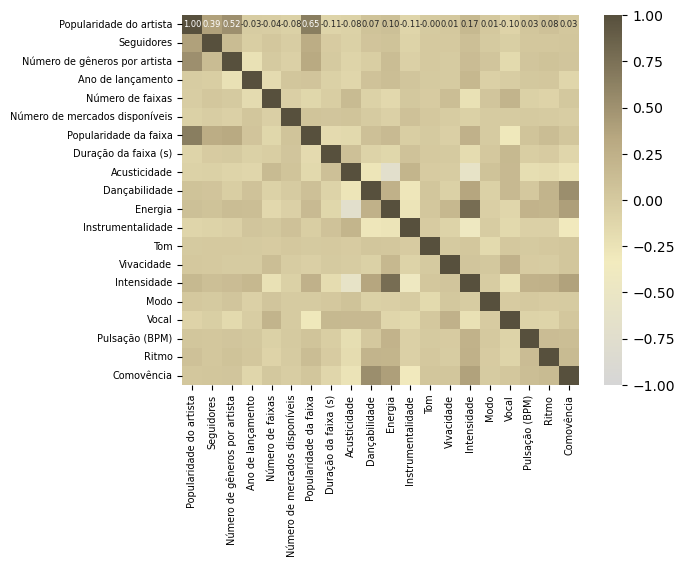

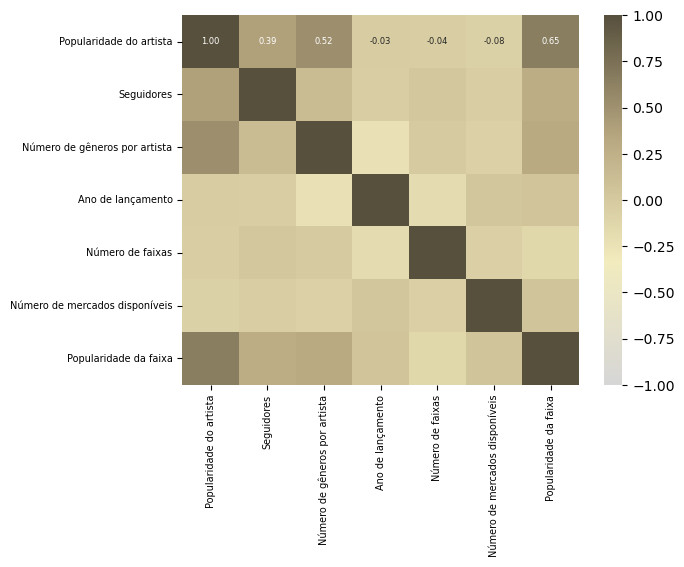

In [11]:
#Criação de paleta de cores melodia. Cores boas: "#4C4C4C", "#808080", "#D6D6D6", "#F2EBBE", "#B8A881", "#57503D".
melodia_colors = ["#D6D6D6", "#F2EBBE", "#B8A881", "#57503D"]
melodia_palette = sns.color_palette(melodia_colors, as_cmap=True)
melodia_grad = sns.blend_palette(melodia_colors, as_cmap=True)

#Criação de data frame numérico para correlações
df_numbers = df_all_inners.select_dtypes(include="number")
df_numbers.drop(columns=["Número do disco", "Número da faixa"], inplace=True)

#Criação do heatmap
heatmap1 = sns.heatmap(df_numbers.corr(),
            annot=True, fmt = '.2f', annot_kws={'size':6},
            vmin = -1,  vmax = 1,
            cmap = melodia_grad)

heatmap1.set_xticklabels(heatmap1.get_xticklabels(), fontsize=7)
heatmap1.set_yticklabels(heatmap1.get_yticklabels(), fontsize=7)
plt.show()

df_numbers.drop(columns=["Duração da faixa (s)",
                         "Acusticidade",
                         "Dançabilidade",
                         "Energia",
                         "Instrumentalidade",
                         "Vivacidade",
                         "Intensidade",
                         "Vocal",
                         "Pulsação (BPM)",
                         "Comovência",
                         "Tom",
                         "Modo",
                         "Ritmo"], inplace=True)

heatmap2 = sns.heatmap(df_numbers.corr(),
            annot=True, fmt=".2f", annot_kws={"size":6},
            vmin=-1, vmax=1,
            cmap=melodia_grad)

heatmap2.set_xticklabels(heatmap2.get_xticklabels(), fontsize=7)
heatmap2.set_yticklabels(heatmap2.get_yticklabels(), fontsize=7)
plt.show()

c:\Users\rodes\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\rodes\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\rodes\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\rodes\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

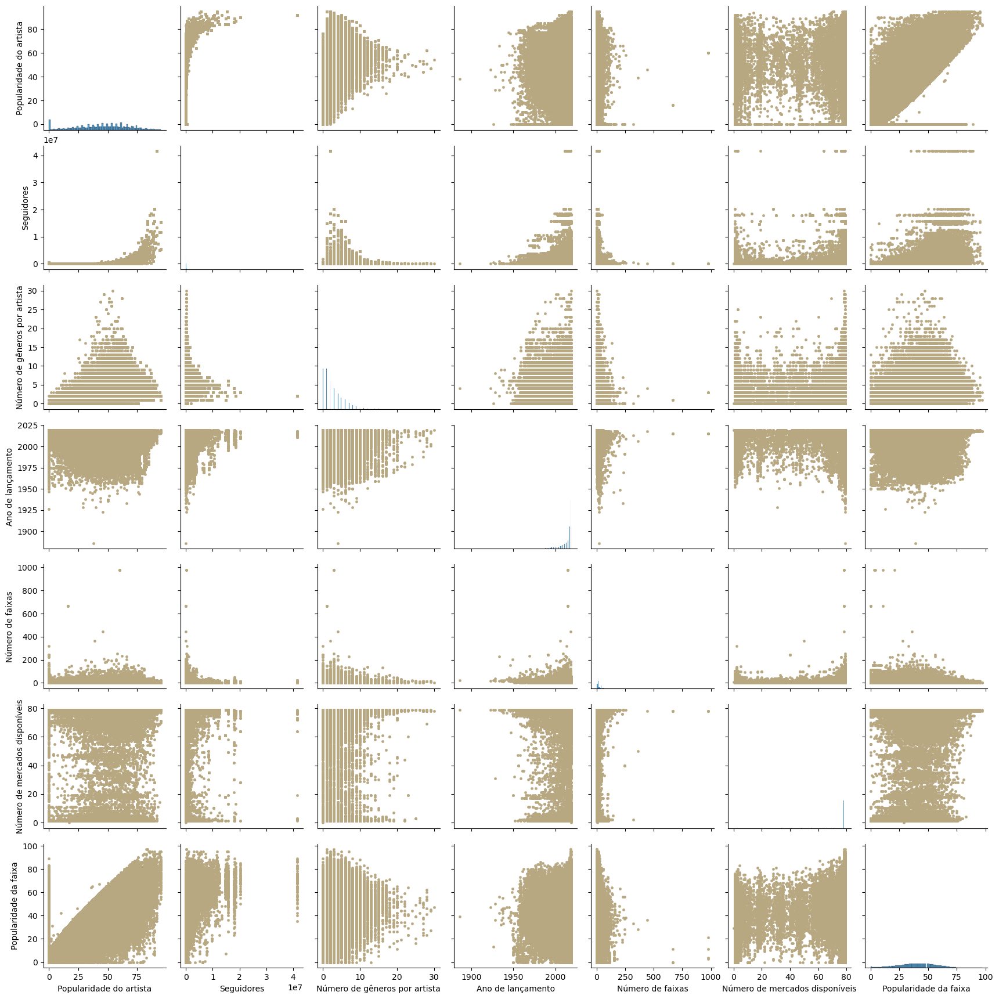

In [12]:
#Criação de pairplot
sns.pairplot(df_numbers, plot_kws= {
    'color': '#B8A881',             #Cor dos pontos
    'alpha': 1,                     #Transparência dos pontos
    's': 10,                        #Tamanho dos pontos
    'marker': 'o',                  #Estilo do marcador (círculo)
    'edgecolor': '#B8A881'})        #Cor da borda dos pontos

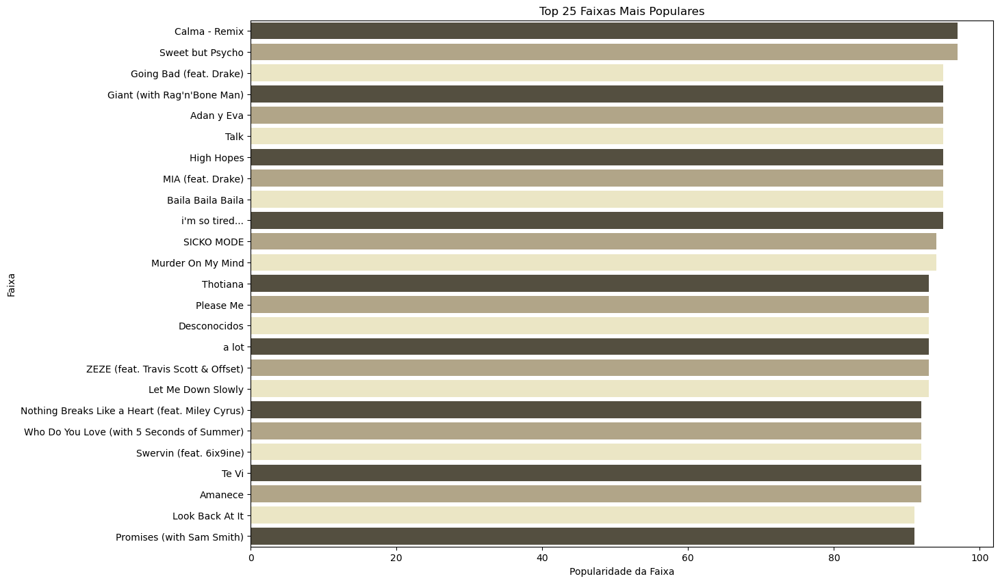

In [28]:
#Criação de data frame ditado pela popularidade das faixas
df_trackspopularity = df_all_inners.sort_values(by="Popularidade da faixa", ascending=False).head(25)

#Plotagem do gráfico de barras referente aos 250 albuns mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_trackspopularity, x="Popularidade da faixa", y="Nome da faixa", palette=melodia_colors[:0:-1])
plt.xlabel('Popularidade da Faixa')
plt.ylabel('Faixa')
plt.title('Top 25 Faixas Mais Populares')
plt.show()

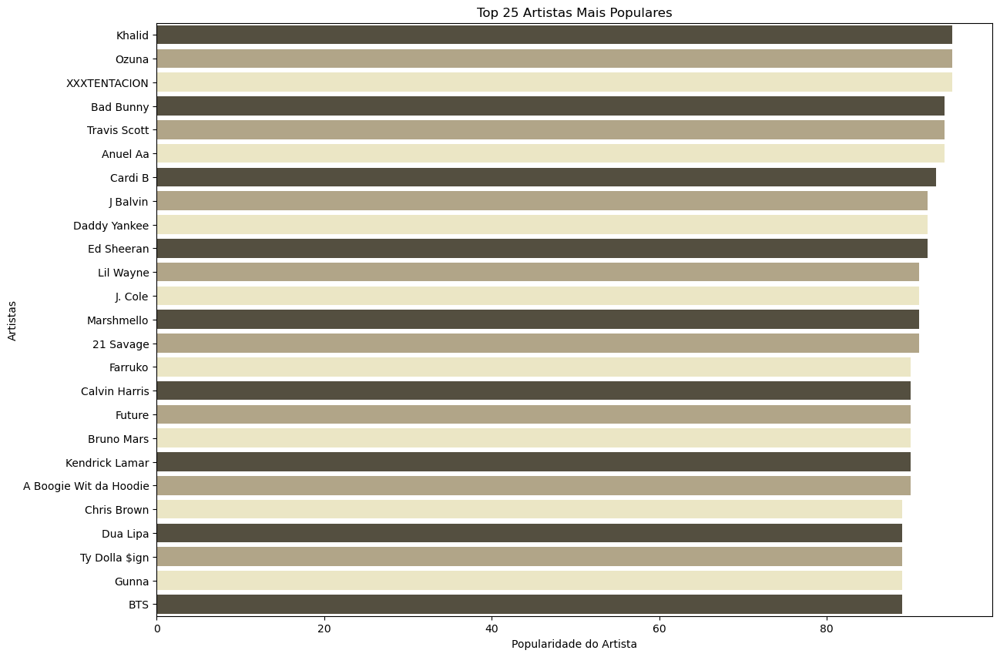

In [29]:
#Criação de data frame ditado pela popularidade das faixas
df_artistspopularity = df_all_inners.groupby("Nome do artista")["Popularidade do artista"].mean().reset_index()
df_artistspopularity = df_artistspopularity.sort_values(by="Popularidade do artista", ascending=False).head(25)

#Plotagem do gráfico de barras referente aos 25 albuns mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_artistspopularity, x="Popularidade do artista", y="Nome do artista", palette=melodia_colors[:0:-1])
plt.xlabel('Popularidade do Artista')
plt.ylabel('Artistas')
plt.title('Top 25 Artistas Mais Populares')
plt.show()

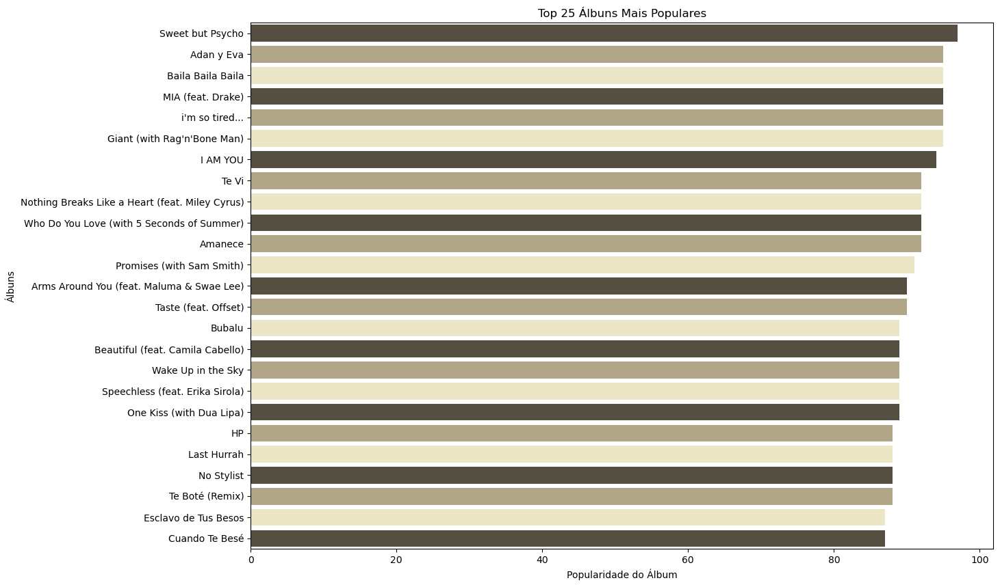

In [30]:
df_albumpopularity = df_all_inners.groupby("Nome do álbum")["Popularidade da faixa"].mean().reset_index()
df_albumpopularity = df_albumpopularity.sort_values(by="Popularidade da faixa", ascending=False).head(25)

#Plotagem do gráfico de barras referente aos 25 albuns mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_albumpopularity, x="Popularidade da faixa", y="Nome do álbum", palette=melodia_colors[:0:-1])
plt.xlabel('Popularidade do Álbum')
plt.ylabel('Álbuns')
plt.title('Top 25 Álbuns Mais Populares')
plt.show()

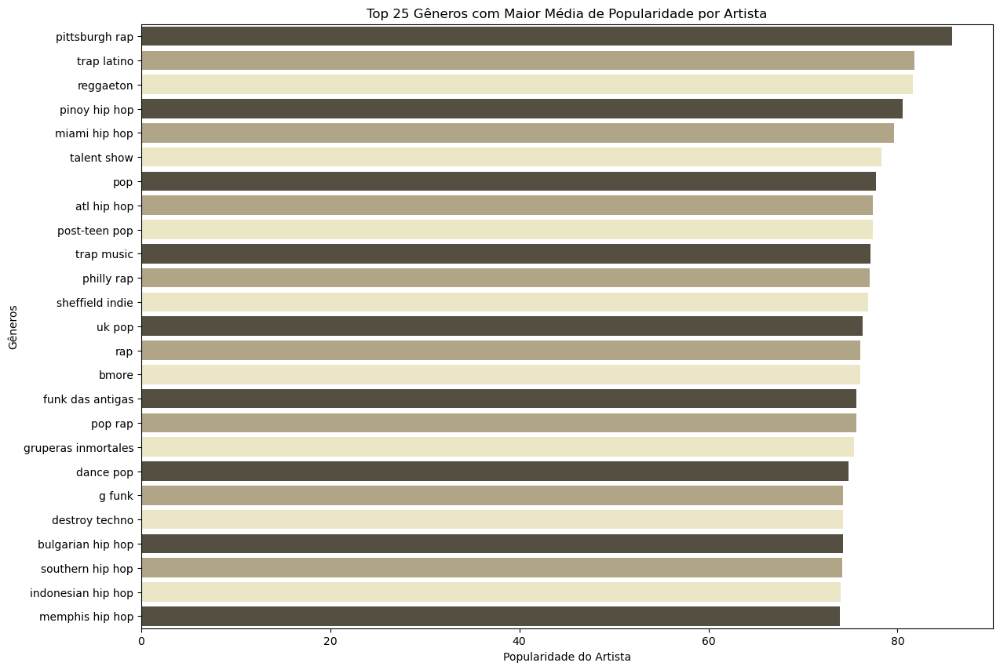

In [31]:
df_genre = df_genre.sort_values(by="Média da popularidade do artista por gênero", ascending=False).head(25)

#Plotagem do gráfico de barras referente aos 25 gêneros mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_genre, x="Média da popularidade do artista por gênero", y="Gêneros", palette=melodia_colors[:0:-1])
plt.xlabel('Popularidade do Artista')
plt.ylabel('Gêneros')
plt.title('Top 25 Gêneros com Maior Média de Popularidade por Artista')
plt.show()

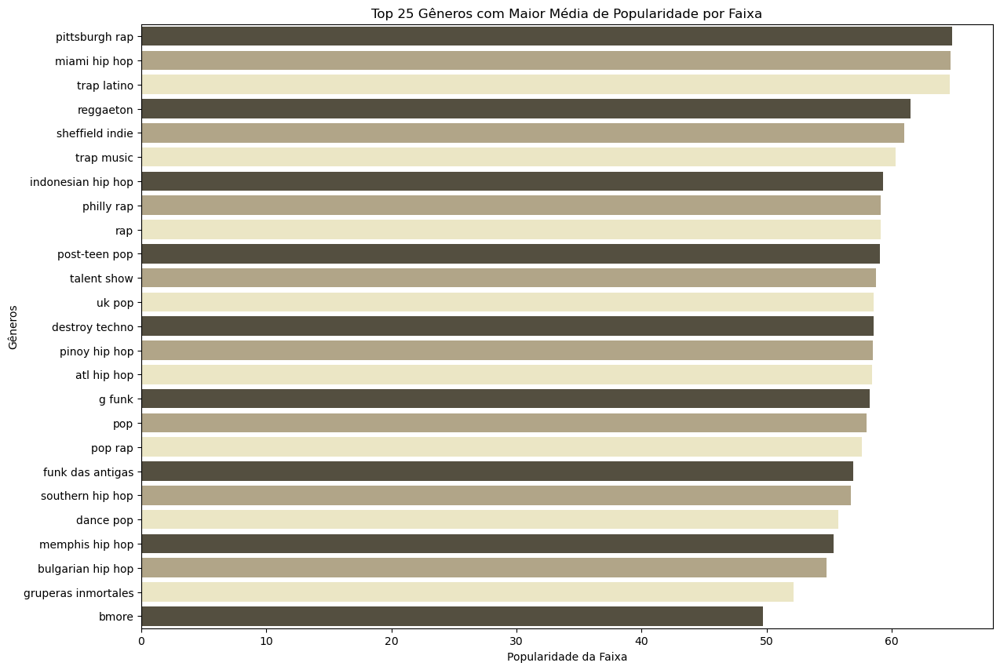

In [32]:
df_genre = df_genre.sort_values(by="Média da popularidade da faixa por gênero", ascending=False).head(25)

#Plotagem do gráfico de barras referente aos 25 albuns mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_genre, x="Média da popularidade da faixa por gênero", y="Gêneros", palette=melodia_colors[:0:-1])
plt.xlabel('Popularidade da Faixa')
plt.ylabel('Gêneros')
plt.title('Top 25 Gêneros com Maior Média de Popularidade por Faixa')
plt.show()

In [18]:
#Remoção de outliers pela popularidade dos artistas e das faixas.
Q1_artist = np.percentile(df_numbers["Popularidade do artista"], 25)
Q3_artist = np.percentile(df_numbers["Popularidade do artista"], 75)
IQR_artist = Q3_artist - Q1_artist
passo_min_artist = Q1_artist - 1.5*IQR_artist
passo_max_artist = Q3_artist + 1.5*IQR_artist

Q1_track = np.percentile(df_numbers["Popularidade da faixa"], 25)
Q3_track = np.percentile(df_numbers["Popularidade da faixa"], 75)
IQR_track = Q3_track - Q1_track
passo_min_track = Q1_track - 1.5*IQR_track
passo_max_track = Q3_track + 1.5*IQR_track


df_popularity_filtered = df_numbers[(df_numbers["Popularidade do artista"] > 0) & 
                                    (df_numbers["Popularidade do artista"] <= passo_max_artist) &
                                    (df_numbers["Popularidade da faixa"] >= passo_min_track) & 
                                    (df_numbers["Popularidade da faixa"] <= passo_max_track)]

px.box(df_popularity_filtered, x="Popularidade do artista", y="Popularidade da faixa", 
       points=False, 
       color_discrete_sequence = melodia_colors[2:4],
       title="Popularidade: artista x faixa")

Ao analisar o gráfico gerado, é visível que quanto maior a popularidade de um artista, maior a probabilidade de sua faixa ser popular, isto é, é recomendado que o cliente foque nos artistas mais populares.

In [19]:
df_numbers["Tipo do álbum"] = df_all_inners["Tipo do álbum"]

#Remoção de outliers pela popularidade dos artistas e seus seguidores.
Q1_artist = np.percentile(df_numbers["Popularidade do artista"], 25)
Q3_artist = np.percentile(df_numbers["Popularidade do artista"], 75)
IQR_artist = Q3_artist - Q1_artist
passo_min_artist = Q1_artist - 1.5*IQR_artist
passo_max_artist = Q3_artist + 1.5*IQR_artist

Q1_followers = np.percentile(df_numbers["Seguidores"], 25)
Q3_followers = np.percentile(df_numbers["Seguidores"], 75)
IQR_followers = Q3_followers - Q1_followers
passo_min_followers = 10000
passo_max_followers = Q3_followers + 4*IQR_followers

df_artpopfollow_filtered = df_numbers[(df_numbers["Popularidade do artista"] > 0) & 
                                    (df_numbers["Popularidade do artista"] <= passo_max_artist) &
                                    (df_numbers["Seguidores"] >= passo_min_followers) & 
                                    (df_numbers["Seguidores"] <= passo_max_followers)]

px.scatter(df_artpopfollow_filtered, x="Seguidores", y="Popularidade do artista",
                                   color="Tipo do álbum",
                                   color_discrete_sequence = melodia_palette[:0:-1],
                                   trendline="ols",
                                   title="Popularidade do artista x Seguidores")

Ao analisar o gráfico gerado, é visível que quanto maior a quantidade de seguidores de um artista, maior a probabilidade do artista ser popular, isto é, é recomendado que o cliente foque nos artistas com maiores quantidades de seguidores.

É interessante notar que, existem artistas que, mesmo com quantidades expressivas de seguidores (1 milhao), possuem popularidade medíocre. Quanto maior a quantidade de seguidores, menor a chance de um artistas ser pouco popular.

In [24]:
px.scatter(df_all_inners, x="Número de gêneros por artista", y="Popularidade do artista", color_discrete_sequence=melodia_colors[2:3])

Quanto maior o número de gêneros por artista, mais limitada é sua popularidade. É interessante dizer que, se um artista tiver poucos números de gêneros trabalhados, não é garantido que ele seja muito ou pouco popular. 

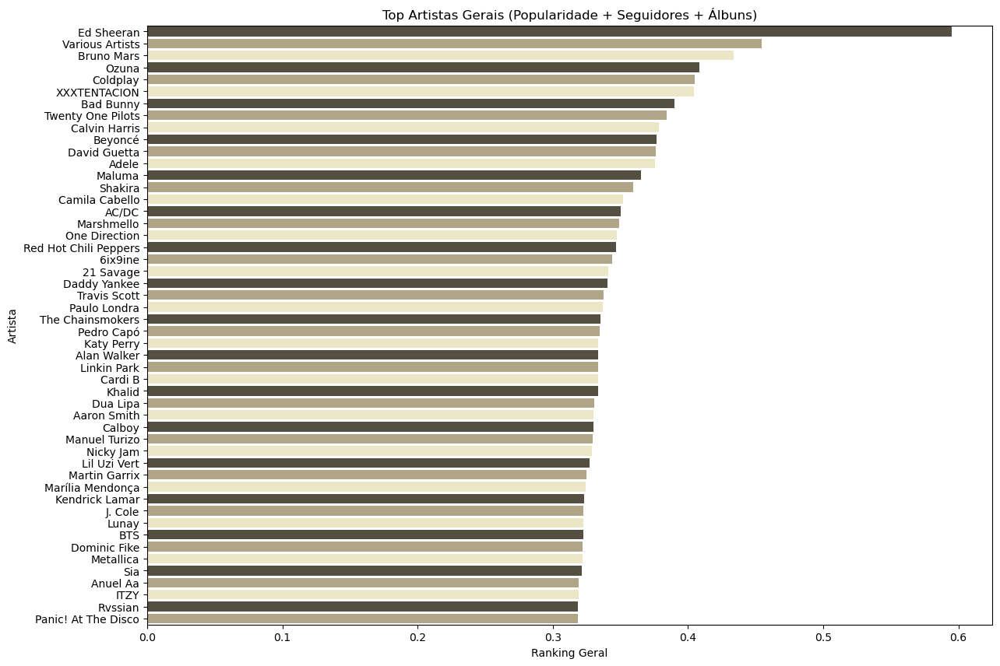

In [ ]:
#Criando um ranking com pontuação combinada
df_artists_combined = df_all_inners.groupby("Nome do artista").agg({
    "Popularidade da faixa": "mean",    # Popularidade da faixa
    "Seguidores": "mean",               # Seguidores
    "Nome do álbum": "count"            # Contando álbuns lançados
}).reset_index()

#Normalizando os valores para combinar no ranking
df_artists_combined["Popularidade Normalizada"] = df_artists_combined["Popularidade da faixa"] / df_artists_combined["Popularidade da faixa"].max()
df_artists_combined["Seguidores Normalizados"] = df_artists_combined["Seguidores"] / df_artists_combined["Seguidores"].max()
df_artists_combined["Álbuns Normalizados"] = df_artists_combined["Nome do álbum"] / df_artists_combined["Nome do álbum"].max()

#Criando uma métrica combinada (exemplo: média dos três fatores)
df_artists_combined["Ranking Geral"] = (df_artists_combined["Popularidade Normalizada"] + df_artists_combined["Seguidores Normalizados"] + df_artists_combined["Álbuns Normalizados"]) / 3

#Ordenando e pegando os Top artistas
df_artists_combined = df_artists_combined.sort_values(by="Ranking Geral", ascending=False).head(50)

plt.figure(figsize=(14, 10))
sns.barplot(data=df_artists_combined, x="Ranking Geral", y="Nome do artista", palette=melodia_colors[:0:-1])
plt.xlabel('Ranking Geral')
plt.ylabel('Artista')
plt.title('Top Artistas Gerais (Popularidade + Seguidores + Álbuns)')
plt.show()